In [1]:
import numpy as np
import pandas as pd
from scipy.io import loadmat
import tensorflow.keras as keras
from sklearn.preprocessing import MinMaxScaler

2022-02-18 15:17:06.614068: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [2]:
class Datasets:
    MFPT_BASE = "/media/sda1/dataset/MFPT/MFPT Fault Data Sets"
    MFPT_DATA = "1 - Three Baseline Conditions"
    MFPT_MAT = "baseline_1.mat"
    MFPT_ABNORMAL_DATA = "2 - Three Outer Race Fault Conditions"
    MFPT_ABNORMAL_MAT = "OuterRaceFault_1.mat"

In [3]:
class Preprocessing:

    @staticmethod
    def create_dataset(data, window_size, preprocess=False):
        org_shape = data.shape
        truncated = data.size - (int(data.size/window_size) * window_size)
        data = data[:data.size - truncated]
        
        if preprocess:
            minmax = MinMaxScaler()
            data = minmax.fit_transform(data)
        dataset = np.empty((int(data.size/window_size), window_size, 1))
        j = 0
        for i in [n*window_size for n in range(int(data.size/window_size))]:
            dataset[j] = data[i:i+window_size]
            j = j + 1
            
        print(f"Dataset shape changed {org_shape} -> {dataset.shape}.")
        print(f"Truncated {truncated} values ")
        #print(f"{data[data.size-100:data.size-50]}, {dataset[-2]}")
        #print(f"{data[data.size-50:data.size]}, {dataset[-1]}")
        return dataset
    
    @staticmethod
    def create_overlap_dataset(data, window_size, preprocess=False):
        org_shape = data.shape
        if preprocess:
            minmax = MinMaxScaler()
            data = minmax.fit_transform(data)
        dataset = np.empty((data.size-window_size+1, window_size, 1))
        j = 0
        for i in range(data.size-window_size+1):
            dataset[j] = data[i:i+window_size]
            j = j + 1
        print(f"Dataset shape changed {org_shape} -> {dataset.shape}")
        #print(f"{data[data.size-100:data.size-50]}, {dataset[-2]}")
        #print(f"{data[data.size-50:data.size]}, {dataset[-1]}")
        return dataset

In [4]:
import os
path = os.path.join(Datasets.MFPT_BASE, Datasets.MFPT_ABNORMAL_DATA, Datasets.MFPT_ABNORMAL_MAT)
    
mat = loadmat(path)
keys = mat['bearing'].dtype.fields
mat_dict = {
    list(keys.keys())[0] : mat['bearing'][0][0][0],
    list(keys.keys())[1] : mat['bearing'][0][0][1],
    list(keys.keys())[2] : mat['bearing'][0][0][2],
    list(keys.keys())[3] : mat['bearing'][0][0][3]
}
print(keys)
dataset = Preprocessing.create_dataset(mat_dict['gs'], 50)

{'rate': (dtype('O'), 0), 'load': (dtype('O'), 8), 'gs': (dtype('O'), 16), 'sr': (dtype('O'), 24)}
Dataset shape changed (585936, 1) -> (11718, 50, 1).
Truncated 36 values 


In [5]:
import numpy
arr = numpy.array(dataset)
rs = arr.reshape(11718,50*1)

print(rs.shape)

(11718, 50)


(11718, 50, 50)


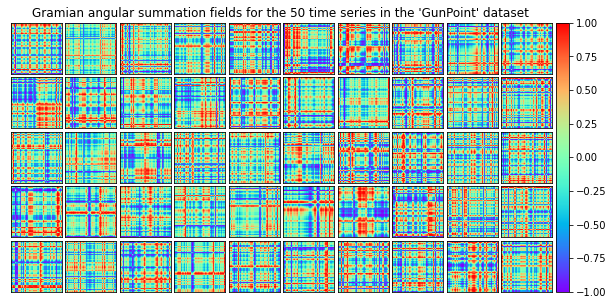

In [6]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from pyts.image import GramianAngularField
from pyts.datasets import load_gunpoint


# Get the Gramian angular summation fields for all the time series
gaf = GramianAngularField(method='difference')
X_gaf = gaf.fit_transform(rs)

print(X_gaf.shape)
# Plot the 50 Gramian angular fields
fig = plt.figure(figsize=(10, 5))

grid = ImageGrid(fig, 111, nrows_ncols=(5, 10), axes_pad=0.05, share_all=True, cbar_mode='single')
for i, ax in enumerate(grid):
    im = ax.imshow(X_gaf[i], cmap='rainbow', origin='lower', vmin=-1., vmax=1.)
grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])
plt.colorbar(im, cax=grid.cbar_axes[0])
ax.cax.toggle_label(True)

fig.suptitle("Gramian angular summation fields for the 50 time series in the "
             "'GunPoint' dataset", y=0.92)

plt.show()

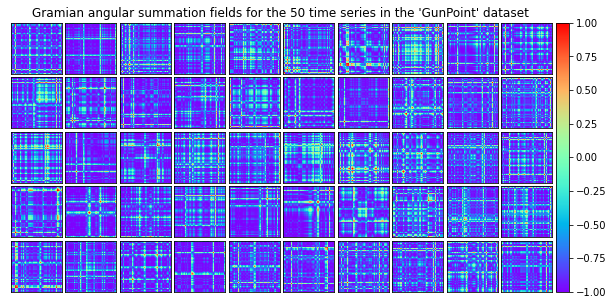

In [54]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from pyts.image import GramianAngularField
from pyts.datasets import load_gunpoint


# Get the Gramian angular summation fields for all the time series
gaf = GramianAngularField(method='summation')
X_gaf = gaf.fit_transform(rs)


# Plot the 50 Gramian angular fields
fig = plt.figure(figsize=(10, 5))

grid = ImageGrid(fig, 111, nrows_ncols=(5, 10), axes_pad=0.05, share_all=True, cbar_mode='single')
for i, ax in enumerate(grid):
    im = ax.imshow(X_gaf[i], cmap='rainbow', origin='lower', vmin=-1., vmax=1.)
grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])
plt.colorbar(im, cax=grid.cbar_axes[0])
ax.cax.toggle_label(True)

fig.suptitle("Gramian angular summation fields for the 50 time series in the "
             "'GunPoint' dataset", y=0.92)

plt.show()

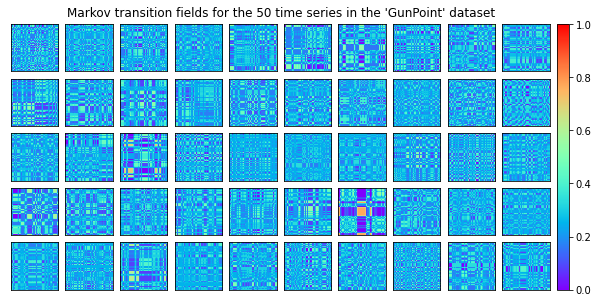

In [19]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from pyts.image import MarkovTransitionField
from pyts.datasets import load_gunpoint


# Get the recurrence plots for all the time series
mtf = MarkovTransitionField(n_bins=4)
X_mtf = mtf.fit_transform(rs)

# Plot the 50 Gramian angular fields
fig = plt.figure(figsize=(10, 5))

grid = ImageGrid(fig, 111, nrows_ncols=(5, 10), axes_pad=0.1, share_all=True,
                 cbar_mode='single')
for i, ax in enumerate(grid):
    im = ax.imshow(X_mtf[i], cmap='rainbow', origin='lower', vmin=0., vmax=1.)
grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])
plt.colorbar(im, cax=grid.cbar_axes[0])
ax.cax.toggle_label(True)

fig.suptitle("Markov transition fields for the 50 time series in the "
             "'GunPoint' dataset", y=0.92)

plt.show()

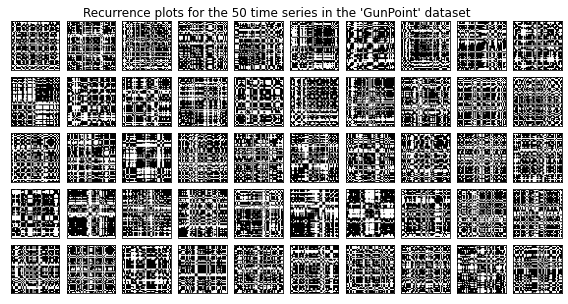

In [33]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from pyts.image import RecurrencePlot
from pyts.datasets import load_gunpoint

# Get the recurrence plots for all the time series
rp = RecurrencePlot(threshold='point', percentage=60)
X_rp = rp.fit_transform(rs)

# Plot the 50 recurrence plots
fig = plt.figure(figsize=(10, 5))

grid = ImageGrid(fig, 111, nrows_ncols=(5, 10), axes_pad=0.1, share_all=True)
for i, ax in enumerate(grid):
    ax.imshow(X_rp[i], cmap='binary', origin='lower')
grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])

fig.suptitle(
    "Recurrence plots for the 50 time series in the 'GunPoint' dataset",
    y=0.92
)

plt.show()

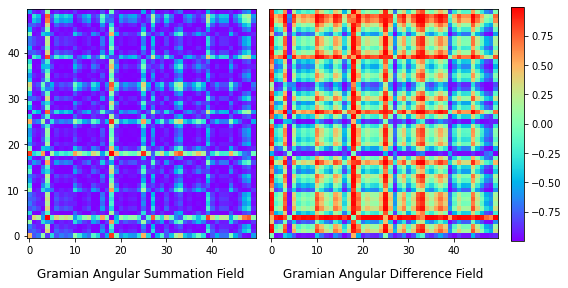

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from pyts.image import GramianAngularField



# Compute Gramian angular fields
gasf = GramianAngularField(method='summation')
X_gasf = gasf.fit_transform(rs)

gadf = GramianAngularField(method='difference')
X_gadf = gadf.fit_transform(rs)

# Plot the time series and its recurrence plot
width_ratios = (2, 7, 7, 0.4)
height_ratios = (2, 7)
width = 10
height = width * sum(height_ratios) / sum(width_ratios)
fig = plt.figure(figsize=(width, height))
gs = fig.add_gridspec(2, 4,  width_ratios=width_ratios,
                      height_ratios=height_ratios,
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.1, hspace=0.1)



# Plot the Gramian angular fields on the bottom right
ax_gasf = fig.add_subplot(gs[1, 1])
ax_gasf.imshow(X_gasf[0], cmap='rainbow', origin='lower')
ax_gasf.set_title('Gramian Angular Summation Field', y=-0.2)

ax_gadf = fig.add_subplot(gs[1, 2])
im = ax_gadf.imshow(X_gadf[0], cmap='rainbow', origin='lower')
ax_gadf.set_yticks([])
ax_gadf.set_title('Gramian Angular Difference Field', y=-0.2)

# Add colorbar
ax_cbar = fig.add_subplot(gs[1, 3])
fig.colorbar(im, cax=ax_cbar)

plt.show()

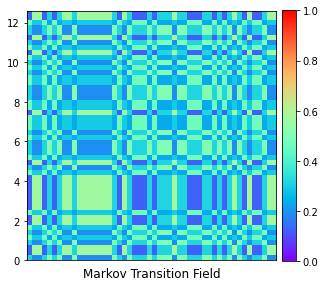

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from pyts.image import MarkovTransitionField


# Compute Gramian angular fields
mtf = MarkovTransitionField(n_bins=3)
X_mtf = mtf.fit_transform(rs)

# Plot the time series and its Markov transition field
width_ratios = (2, 7, 0.4)
height_ratios = (2, 7)
width = 6
height = width * sum(height_ratios) / sum(width_ratios)
fig = plt.figure(figsize=(width, height))
gs = fig.add_gridspec(2, 3,  width_ratios=width_ratios,
                      height_ratios=height_ratios,
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.05, hspace=0.05)


# Plot the Gramian angular fields on the bottom right
ax_mtf = fig.add_subplot(gs[1, 1])
im = ax_mtf.imshow(X_mtf[13], cmap='rainbow', origin='lower', vmin=0., vmax=1.,
                   extent=[0, 4 * np.pi, 0, 4 * np.pi])
ax_mtf.set_xticks([])
ax_mtf.set_title('Markov Transition Field', y=-0.09)

# Add colorbar
ax_cbar = fig.add_subplot(gs[1, 2])
fig.colorbar(im, cax=ax_cbar)

plt.show()

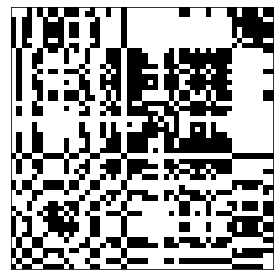

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from pyts.image import RecurrencePlot



# Recurrence plot transformation
rp = RecurrencePlot(threshold='point', percentage=40)
X_rp = rp.fit_transform(rs)

# Plot the time series and its recurrence plot
fig = plt.figure(figsize=(6, 6))

gs = fig.add_gridspec(2, 2,  width_ratios=(2, 7), height_ratios=(2, 7),
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.05, hspace=0.05)


# Plot the recurrence plot on the bottom right
ax_rp = fig.add_subplot(gs[1, 1])
ax_rp.imshow(X_rp[1564], cmap='binary', origin='lower')
ax_rp.set_xticks([])
ax_rp.set_yticks([])

plt.show()

In [19]:
pwd

'/media/sda1/CNN-AutoEncoder(안동주님)'

/tmp/ipykernel_412343/193630904.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(width, height))


KeyboardInterrupt: 

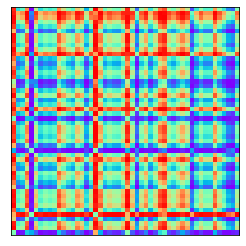

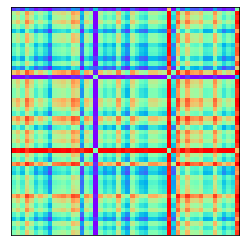

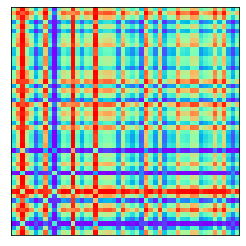

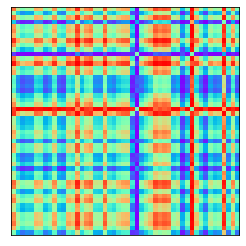

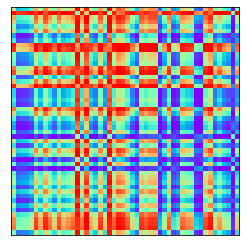

...

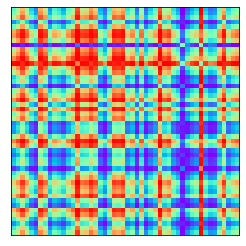

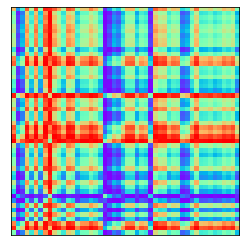

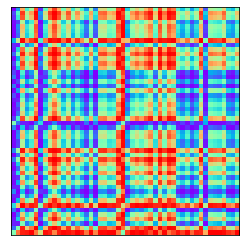

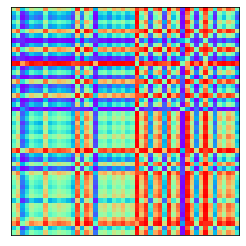

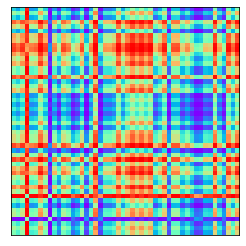

<Figure size 720x395.122 with 0 Axes>

In [50]:
""" 이미지 저장하기 """
import os
# 이미지경로
img_path = "./MFPT_img"

# 사진을 저장할 폴더 생성
if not os.path.exists(img_path):
    os.mkdir(img_path)

# 사진생성
for i in range(rs.shape[0]-1):
    gadf = GramianAngularField(method='difference')
    X_gadf = gadf.fit_transform(rs)
    fig = plt.figure(figsize=(width, height))
    gs = fig.add_gridspec(2, 4,  width_ratios=width_ratios,
                          height_ratios=height_ratios,
                          left=0.1, right=0.9, bottom=0.1, top=0.9,
                          wspace=0.1, hspace=0.1)

    ax_gadf = fig.add_subplot(gs[1, 2])
    im = ax_gadf.imshow(X_gadf[i], cmap='rainbow', origin='lower')
    ax_gadf.set_yticks([])
    ax_gadf.set_xticks([])

    plt.savefig(f'{img_path}/GADF{i}.png')
    